## Drone Video Analysis using [Stanford Drone Dataset](https://cvgl.stanford.edu/projects/uav_data/)

Citation for the dataset: A. Robicquet, A. Sadeghian, A. Alahi, S. Savarese, Learning Social Etiquette: Human Trajectory Prediction In Crowded Scenes in European Conference on Computer Vision (ECCV), 2016.

**Required Libraries**

  * ```moviepy``` - [Docs](https://zulko.github.io/moviepy/index.html)
  * ```ffmpeg```... installed via apt below...
  * ```scikit-video``` - [Docs](http://www.scikit-video.org/stable/)
  * ```opencv-python``` - [Docs](https://docs.opencv.org/master/)

Use a beefy cluster with the following Spark confs set:

```
spark.rpc.message.maxSize 1000
spark.driver.maxResultSize 0
```

In [0]:
%sh
sudo apt install -qq -y ffmpeg > ffmpeg_install.log

WARNING: apt does not have a stable CLI interface. Use with caution in scripts.

debconf: delaying package configuration, since apt-utils is not installed

In [0]:
%pip install moviepy scikit-video opencv-python keras-retinanet

Python interpreter will be restarted.
Collecting moviepy
 Downloading moviepy-1.0.3.tar.gz (388 kB)
Collecting scikit-video
 Downloading scikit_video-1.1.11-py2.py3-none-any.whl (2.3 MB)
Collecting opencv-python
 Downloading opencv_python-4.4.0.46-cp37-cp37m-manylinux2014_x86_64.whl (49.5 MB)
Collecting keras-retinanet
 Downloading keras-retinanet-1.0.0.tar.gz (71 kB)
Requirement already satisfied: decorator<5.0,>=4.0.2 in /local_disk0/.ephemeral_nfs/envs/pythonEnv-ed5e95da-2ed4-41d5-90a6-b84ff45dcb19/lib/python3.7/site-packages (from moviepy) (4.4.1)
Requirement already satisfied: tqdm<5.0,>=4.11.2 in /local_disk0/.ephemeral_nfs/envs/pythonEnv-ed5e95da-2ed4-41d5-90a6-b84ff45dcb19/lib/python3.7/site-packages (from moviepy) (4.42.1)
Requirement already satisfied: requests<3.0,>=2.8.1 in /local_disk0/.ephemeral_nfs/envs/pythonEnv-ed5e95da-2ed4-41d5-90a6-b84ff45dcb19/lib/python3.7/site-packages (from moviepy) (2.22.0)
Collecting proglog<=1.0.0
 Downloading proglog-0.1.9.tar.gz (10 kB)
Requirement already satisfied: numpy>=1.17.3 in /local_disk0/.ephemeral_nfs/envs/pythonEnv-ed5e95da-2ed4-41d5-90a6-b84ff45dcb19/lib/python3.7/site-packages (from moviepy) (1.18.1)
Collecting imageio<3.0,>=2.5
 Downloading imageio-2.9.0-py3-none-any.whl (3.3 MB)
Collecting imageio_ffmpeg>=0.2.0
 Downloading imageio_ffmpeg-0.4.2-py3-none-manylinux2010_x86_64.whl (26.9 MB)
Requirement already satisfied: pillow in /local_disk0/.ephemeral_nfs/envs/pythonEnv-ed5e95da-2ed4-41d5-90a6-b84ff45dcb19/lib/python3.7/site-packages (from scikit-video) (7.0.0)
Requirement already satisfied: scipy in /local_disk0/.ephemeral_nfs/envs/pythonEnv-ed5e95da-2ed4-41d5-90a6-b84ff45dcb19/lib/python3.7/site-packages (from scikit-video) (1.4.1)
Collecting keras-resnet==0.2.0
 Downloading keras-resnet-0.2.0.tar.gz (9.3 kB)
Requirement already satisfied: six in /local_disk0/.ephemeral_nfs/envs/pythonEnv-ed5e95da-2ed4-41d5-90a6-b84ff45dcb19/lib/python3.7/site-packages (from keras-retinanet) (1.14.0)
Requirement already satisfied: cython in /local_disk0/.ephemeral_nfs/envs/pythonEnv-ed5e95da-2ed4-41d5-90a6-b84ff45dcb19/lib/python3.7/site-packages (from keras-retinanet) (0.29.15)
Collecting progressbar2
 Downloading progressbar2-3.53.1-py2.py3-none-any.whl (25 kB)
Requirement already satisfied: urllib3!=1.25.0,!=1.25.1,<1.26,>=1.21.1 in /local_disk0/.ephemeral_nfs/envs/pythonEnv-ed5e95da-2ed4-41d5-90a6-b84ff45dcb19/lib/python3.7/site-packages (from requests<3.0,>=2.8.1->moviepy) (1.25.8)
Requirement already satisfied: idna<2.9,>=2.5 in /local_disk0/.ephemeral_nfs/envs/pythonEnv-ed5e95da-2ed4-41d5-90a6-b84ff45dcb19/lib/python3.7/site-packages (from requests<3.0,>=2.8.1->moviepy) (2.8)
Requirement already satisfied: chardet<3.1.0,>=3.0.2 in /local_disk0/.ephemeral_nfs/envs/pythonEnv-ed5e95da-2ed4-41d5-90a6-b84ff45dcb19/lib/python3.7/site-packages (from requests<3.0,>=2.8.1->moviepy) (3.0.4)
Requirement already satisfied: certifi>=2017.4.17 in /local_disk0/.ephemeral_nfs/envs/pythonEnv-ed5e95da-2ed4-41d5-90a6-b84ff45dcb19/lib/python3.7/site-packages (from requests<3.0,>=2.8.1->moviepy) (2020.6.20)
Collecting keras>=2.2.4
 Downloading Keras-2.4.3-py2.py3-none-any.whl (36 kB)
Collecting python-utils>=2.3.0
 Downloading python_utils-2.4.0-py2.py3-none-any.whl (12 kB)
Requirement already satisfied: pyyaml in /local_disk0/.ephemeral_nfs/envs/pythonEnv-ed5e95da-2ed4-41d5-90a6-b84ff45dcb19/lib/python3.7/site-packages (from keras>=2.2.4->keras-resnet==0.2.0->keras-retinanet) (5.3.1)
Requirement already satisfied: h5py in /local_disk0/.ephemeral_nfs/envs/pythonEnv-ed5e95da-2ed4-41d5-90a6-b84ff45dcb19/lib/python3.7/site-packages (from keras>=2.2.4->keras-resnet==0.2.0->keras-retinanet) (2.10.0)
Building wheels for collected packages: moviepy, keras-retinanet, proglog, keras-resnet
 Building wheel for moviepy (setup.py): started
 Building wheel for moviepy (setup.py): finished with status 'done'
 Created wheel for moviepy: filename=moviepy-1.0.3-py3-none-any.whl size=110727 sha256=1cbd696329ce9d3

In [0]:
USER = dbutils.notebook.entry_point.getDbutils().notebook().getContext().tags().get("user").getOrElse(None)

INPUT_DIR_DBFS = "dbfs:/databricks-datasets-private/ML/stanford_drone/videos/"
INPUT_DIR = "/" + INPUT_DIR_DBFS.replace(":", "")

SPLIT_DIR_DBFS = "dbfs:/home/{}/drone/bronze/out/".format(USER)
SPLIT_DIR = "/" + SPLIT_DIR_DBFS.replace(":", "")

VIDEO_OUTPUT_DIR_DBFS = "dbfs:/home/{}/drone/silver/out/".format(USER)
VIDEO_OUTPUT_DIR = "/" + VIDEO_OUTPUT_DIR_DBFS.replace(":", "")

IMG_DIR_DBFS = "dbfs:/home/{}/drone/gold/out/".format(USER)
IMG_DIR = "/" + IMG_DIR_DBFS.replace(":", "")

IMG_OUTPUT_DIR_DBFS = "dbfs:/home/{}/drone/gold/out/delta/".format(USER)
IMG_OUTPUT_DIR = "/" + IMG_OUTPUT_DIR_DBFS.replace(":", "")

FORMAT = ".mov"
SPLIT_BY_SECONDS = 30

#dbutils.fs.rm(SPLIT_DIR_DBFS, recurse=True)
#dbutils.fs.rm(VIDEO_OUTPUT_DIR_DBFS, recurse=True)

dbutils.fs.mkdirs(SPLIT_DIR_DBFS)
dbutils.fs.mkdirs(VIDEO_OUTPUT_DIR_DBFS)
dbutils.fs.mkdirs(IMG_DIR_DBFS)
dbutils.fs.mkdirs(IMG_OUTPUT_DIR_DBFS)

Out[1]: True

In [0]:
from pyspark.sql.functions import regexp_replace, asc

input_df = spark.read.format("binaryFile").option("pathGlobFilter", "*{}".format(FORMAT)).load(INPUT_DIR_DBFS).withColumn("path", regexp_replace("path", "dbfs:/", "/dbfs/")).select("path", "modificationTime", "length")

display(input_df.orderBy(asc("path")))

path,modificationTime,length
/dbfs/databricks-datasets-private/ML/stanford_drone/videos/bookstore_video0.mov,2020-05-04T09:54:17.000+0000,923235378
/dbfs/databricks-datasets-private/ML/stanford_drone/videos/bookstore_video1.mov,2020-05-04T09:54:17.000+0000,1061568487
/dbfs/databricks-datasets-private/ML/stanford_drone/videos/bookstore_video2.mov,2020-05-04T09:54:17.000+0000,1107683057
/dbfs/databricks-datasets-private/ML/stanford_drone/videos/bookstore_video3.mov,2020-05-04T09:54:17.000+0000,972924580
/dbfs/databricks-datasets-private/ML/stanford_drone/videos/bookstore_video4.mov,2020-05-04T09:54:18.000+0000,1380649400
/dbfs/databricks-datasets-private/ML/stanford_drone/videos/bookstore_video5.mov,2020-05-04T09:54:18.000+0000,1208401693
/dbfs/databricks-datasets-private/ML/stanford_drone/videos/bookstore_video6.mov,2020-05-04T09:54:18.000+0000,998276533
/dbfs/databricks-datasets-private/ML/stanford_drone/videos/coupa_video0.mov,2020-05-04T09:54:18.000+0000,1655445739
/dbfs/databricks-datasets-private/ML/stanford_drone/videos/coupa_video1.mov,2020-05-04T09:54:18.000+0000,1344073750
/dbfs/databricks-datasets-private/ML/stanford_drone/videos/coupa_video2.mov,2020-05-04T09:54:18.000+0000,1317541453


### Handling large video files...

The JVM can't allocate byte arrays larger than 2147483647 bytes (2.14Gb), therefore the size of the content column cannot exceed this size no matter what resources you give to the cluster... We can still process larger video files, we'd just need to:

* Not read in the content column when processing the data
* Split them up into chunks of a more manageable size

In [0]:
from pyspark.sql.functions import udf, col, lit, explode

@udf("array<string>")
def split_video_files(video_file, modification_time, split_by_seconds, output_dir):
  
  import os
  from os.path import basename
  from moviepy.editor import VideoFileClip
  from datetime import timedelta 
  from moviepy.video.io.ffmpeg_tools import ffmpeg_extract_subclip
  
  clip = VideoFileClip(video_file)
  duration = round(clip.duration + 0.5) # Use 0.5 so we always round up, as opposed to down...

  extracted_list = []  
  for i in range(0, duration, split_by_seconds):   
    
    start, end = i, i + split_by_seconds
    time_format = "%Y-%m-%dT%H:%M:%S"
    start_time, end_time = modification_time + timedelta(seconds=start), modification_time + timedelta(seconds=end)
    output_filename = f"start_{start_time.strftime(time_format)}_end_{end_time.strftime(time_format)}_{basename(video_file)}"
    local_file = f"/tmp/{output_filename}"
    
    if not os.path.isfile(output_filename):
      # Check whether the target file exists or not before creating it
      ffmpeg_extract_subclip(video_file, start, end, local_file) 
      output_path = output_dir + output_filename
    
    try:
      import shutil
      # copy-then-delete, because it's moving between different filesystems, 
      # and writing locally before copying to an NFS mount is safer
      shutil.move(local_file, output_path)
      extracted_list.append(output_path)
    except Exception as e:
      print(f"Error moving {local_file} to {video_file} : {e}")
  return extracted_list

output_df = input_df.withColumn("output_file", explode(split_video_files(col("path"), col("modificationTime"), lit(SPLIT_BY_SECONDS), lit(SPLIT_DIR)))).drop("length")
display(output_df)

path,modificationTime,output_file
/dbfs/databricks-datasets-private/ML/stanford_drone/videos/little_video2.mov,2020-05-04T09:54:20.000+0000,/dbfs/home/andrew.weaver@databricks.com/drone/bronze/out/start_2020-05-04T09:54:20_end_2020-05-04T09:54:50_little_video2.mov
/dbfs/databricks-datasets-private/ML/stanford_drone/videos/little_video2.mov,2020-05-04T09:54:20.000+0000,/dbfs/home/andrew.weaver@databricks.com/drone/bronze/out/start_2020-05-04T09:54:50_end_2020-05-04T09:55:20_little_video2.mov
/dbfs/databricks-datasets-private/ML/stanford_drone/videos/little_video2.mov,2020-05-04T09:54:20.000+0000,/dbfs/home/andrew.weaver@databricks.com/drone/bronze/out/start_2020-05-04T09:55:20_end_2020-05-04T09:55:50_little_video2.mov
/dbfs/databricks-datasets-private/ML/stanford_drone/videos/little_video2.mov,2020-05-04T09:54:20.000+0000,/dbfs/home/andrew.weaver@databricks.com/drone/bronze/out/start_2020-05-04T09:55:50_end_2020-05-04T09:56:20_little_video2.mov
/dbfs/databricks-datasets-private/ML/stanford_drone/videos/little_video2.mov,2020-05-04T09:54:20.000+0000,/dbfs/home/andrew.weaver@databricks.com/drone/bronze/out/start_2020-05-04T09:56:20_end_2020-05-04T09:56:50_little_video2.mov
/dbfs/databricks-datasets-private/ML/stanford_drone/videos/little_video2.mov,2020-05-04T09:54:20.000+0000,/dbfs/home/andrew.weaver@databricks.com/drone/bronze/out/start_2020-05-04T09:56:50_end_2020-05-04T09:57:20_little_video2.mov
/dbfs/databricks-datasets-private/ML/stanford_drone/videos/little_video2.mov,2020-05-04T09:54:20.000+0000,/dbfs/home/andrew.weaver@databricks.com/drone/bronze/out/start_2020-05-04T09:57:20_end_2020-05-04T09:57:50_little_video2.mov
/dbfs/databricks-datasets-private/ML/stanford_drone/videos/little_video2.mov,2020-05-04T09:54:20.000+0000,/dbfs/home/andrew.weaver@databricks.com/drone/bronze/out/start_2020-05-04T09:57:50_end_2020-05-04T09:58:20_little_video2.mov
/dbfs/databricks-datasets-private/ML/stanford_drone/videos/little_video2.mov,2020-05-04T09:54:20.000+0000,/dbfs/home/andrew.weaver@databricks.com/drone/bronze/out/start_2020-05-04T09:58:20_end_2020-05-04T09:58:50_little_video2.mov
/dbfs/databricks-datasets-private/ML/stanford_drone/videos/little_video2.mov,2020-05-04T09:54:20.000+0000,/dbfs/home/andrew.weaver@databricks.com/drone/bronze/out/start_2020-05-04T09:58:50_end_2020-05-04T09:59:20_little_video2.mov


In [0]:
display(dbutils.fs.ls(SPLIT_DIR_DBFS))

path,name,size
dbfs:/home/andrew.weaver@databricks.com/drone/bronze/out/start_2020-05-04T09:54:17_end_2020-05-04T09:54:47_bookstore_video0.mov,start_2020-05-04T09:54:17_end_2020-05-04T09:54:47_bookstore_video0.mov,61690373
dbfs:/home/andrew.weaver@databricks.com/drone/bronze/out/start_2020-05-04T09:54:17_end_2020-05-04T09:54:47_bookstore_video1.mov,start_2020-05-04T09:54:17_end_2020-05-04T09:54:47_bookstore_video1.mov,68071459
dbfs:/home/andrew.weaver@databricks.com/drone/bronze/out/start_2020-05-04T09:54:17_end_2020-05-04T09:54:47_bookstore_video2.mov,start_2020-05-04T09:54:17_end_2020-05-04T09:54:47_bookstore_video2.mov,72249239
dbfs:/home/andrew.weaver@databricks.com/drone/bronze/out/start_2020-05-04T09:54:17_end_2020-05-04T09:54:47_bookstore_video3.mov,start_2020-05-04T09:54:17_end_2020-05-04T09:54:47_bookstore_video3.mov,62940388
dbfs:/home/andrew.weaver@databricks.com/drone/bronze/out/start_2020-05-04T09:54:18_end_2020-05-04T09:54:48_bookstore_video4.mov,start_2020-05-04T09:54:18_end_2020-05-04T09:54:48_bookstore_video4.mov,86808631
dbfs:/home/andrew.weaver@databricks.com/drone/bronze/out/start_2020-05-04T09:54:18_end_2020-05-04T09:54:48_bookstore_video5.mov,start_2020-05-04T09:54:18_end_2020-05-04T09:54:48_bookstore_video5.mov,82351907
dbfs:/home/andrew.weaver@databricks.com/drone/bronze/out/start_2020-05-04T09:54:18_end_2020-05-04T09:54:48_bookstore_video6.mov,start_2020-05-04T09:54:18_end_2020-05-04T09:54:48_bookstore_video6.mov,66908896
dbfs:/home/andrew.weaver@databricks.com/drone/bronze/out/start_2020-05-04T09:54:18_end_2020-05-04T09:54:48_coupa_video0.mov,start_2020-05-04T09:54:18_end_2020-05-04T09:54:48_coupa_video0.mov,123781589
dbfs:/home/andrew.weaver@databricks.com/drone/bronze/out/start_2020-05-04T09:54:18_end_2020-05-04T09:54:48_coupa_video1.mov,start_2020-05-04T09:54:18_end_2020-05-04T09:54:48_coupa_video1.mov,99196300
dbfs:/home/andrew.weaver@databricks.com/drone/bronze/out/start_2020-05-04T09:54:18_end_2020-05-04T09:54:48_coupa_video2.mov,start_2020-05-04T09:54:18_end_2020-05-04T09:54:48_coupa_video2.mov,96330937


### Using [scikit-video](http://www.scikit-video.org/stable/io.html?#reading-video-metadata) we should be able to extract the timestamp from the video metadata instead

In the example above, we've used the modificationTime of the file (in this case the timestamp of when the file was written to DBFS). If the processed video has associated timestamps within its metadata we might be able to use these instead...

In [0]:
import skvideo.io
import json

metadata = skvideo.io.ffprobe("/dbfs/databricks-datasets-private/ML/stanford_drone/videos/bookstore_video0.mov")
print(metadata.keys())
print(json.dumps(metadata["video"], indent=4))

dict_keys(['video'])
{
 "@index": "0",
 "@codec_name": "mjpeg",
 "@codec_long_name": "Motion JPEG",
 "@codec_type": "video",
 "@codec_time_base": "100/2997",
 "@codec_tag_string": "jpeg",
 "@codec_tag": "0x6765706a",
 "@width": "1424",
 "@height": "1088",
 "@coded_width": "1424",
 "@coded_height": "1088",
 "@has_b_frames": "0",
 "@sample_aspect_ratio": "0:1",
 "@display_aspect_ratio": "0:1",
 "@pix_fmt": "yuvj420p",
 "@level": "-99",
 "@color_range": "pc",
 "@color_space": "bt470bg",
 "@chroma_location": "center",
 "@refs": "1",
 "@r_frame_rate": "2997/100",
 "@avg_frame_rate": "2997/100",
 "@time_base": "1/2997",
 "@start_pts": "0",
 "@start_time": "0.000000",
 "@duration_ts": "1333500",
 "@duration": "444.944945",
 "@bit_rate": "16597613",
 "@bits_per_raw_sample": "8",
 "@nb_frames": "13335",
 "disposition": {
 "@default": "1",
 "@dub": "0",
 "@original": "0",
 "@comment": "0",
 "@lyrics": "0",
 "@karaoke": "0",
 "@forced": "0",
 "@hearing_impaired": "0",
 "@visual_impaired": "0",
 "@clean_effects": "0",
 "@attached_pic": "0",
 "@timed_thumbnails": "0"
 },
 "tag": [
 {
 "@key": "language",
 "@value": "eng"
 },
 {
 "@key": "handler_name",
 "@value": "DataHandler"
 },
 {
 "@key": "encoder",
 "@value": "mjpeg"
 }
 ]
}

Some video results are still larger than the max RPC size as such, the following cluster config might be required:

```spark.rpc.message.maxSize 3000```

Let's take a look at one of the chunked up videos...

In [0]:
from moviepy.editor import VideoFileClip
import os, random

clip = VideoFileClip(f"{SPLIT_DIR}/{random.choice(os.listdir(SPLIT_DIR))}")
clip = clip.subclip(0, 5)
clip.ipython_display(fps=20, width=1000)

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4

t: 0%| | 0/100 [00:00<?, ?it/s, now=None]t: 6%|▌ | 6/100 [00:00<00:01, 55.64it/s, now=None]t: 10%|█ | 10/100 [00:00<00:01, 48.72it/s, now=None]t: 14%|█▍ | 14/100 [00:00<00:01, 43.34it/s, now=None]t: 18%|█▊ | 18/100 [00:00<00:02, 40.75it/s, now=None]t: 22%|██▏ | 22/100 [00:00<00:01, 39.40it/s, now=None]t: 26%|██▌ | 26/100 [00:00<00:01, 38.81it/s, now=None]t: 30%|███ | 30/100 [00:00<00:01, 38.69it/s, now=None]t: 34%|███▍ | 34/100 [00:00<00:01, 38.10it/s, now=None]t: 38%|███▊ | 38/100 [00:00<00:01, 37.57it/s, now=None]t: 42%|████▏ | 42/100 [00:01<00:01, 37.08it/s, now=None]t: 46%|████▌ | 46/100 [00:01<00:01, 37.20it/s, now=None]t: 50%|█████ | 50/100 [00:01<00:01, 36.74it/s, now=None]t: 54%|█████▍ | 54/100 [00:01<00:01, 36.11it/s, now=None]t: 58%|█████▊ | 58/100 [00:01<00:01, 35.61it/s, now=None]t: 62%|██████▏ | 62/100 [00:01<00:01, 36.10it/s, now=None]t: 66%|██████▌ | 66/100 [00:01<00:00, 36.16it/s, now=None]t: 70%|███████ | 70/100 [00:01<00:00, 35.79it/s, now=None]t: 74%|███████▍ | 74/100 [00:01<00:00, 35.87it/s, now=None]t: 78%|███████▊ | 78/100 [00:02<00:00, 36.17it/s, now=None]t: 82%|████████▏ | 82/100 [00:02<00:00, 36.63it/s, now=None]t: 86%|████████▌ | 86/100 [00:02<00:00, 37.12it/s, now=None]t: 90%|█████████ | 90/100 [00:02<00:00, 36.47it/s, now=None]t: 94%|█████████▍| 94/100 [00:02<00:00, 36.12it/s, now=None]t: 98%|█████████▊| 98/100 [00:02<00:00, 35.88it/s, now=None] Moviepy - Done !
Moviepy - video ready __temp__.mp4
Out[6]:

<video width='1000'src='data:video/mp4;base64,AAAAIGZ0eXBpc29tAAACAGlzb21pc28yYXZjMW1wNDEAAAAIZnJlZQBHPYttZGF0AAACVQYF//9R3EXpvebZSLeWLNgg2SPu73gyNjQgLSBjb3JlIDE1OSByMjk5MSAxNzcxYjU1IC0gSC4yNjQvTVBFRy00IEFWQyBjb2RlYyAtIENvcHlsZWZ0IDIwMDMtMjAxOSAtIGh0dHA6Ly93d3cudmlkZW9sYW4ub3JnL3gyNjQuaHRtbCAtIG9wdGlvbnM6IGNhYmFjPTAgcmVmPTEgZGVibG9jaz0wOjA6MCBhbmFseXNlPTA6MCBtZT1kaWEgc3VibWU9MCBwc3k9MSBwc3lfcmQ9MS4wMDowLjAwIG1peGVkX3JlZj0wIG1lX3JhbmdlPTE2IGNocm9tYV9tZT0xIHRyZWxsaXM9MCA4eDhkY3Q9MCBjcW09MCBkZWFkem9uZT0yMSwxMSBmYXN0X3Bza2lwPTEgY2hyb21hX3FwX29mZnNldD02IHRocmVhZHM9MzQgbG9va2FoZWFkX3RocmVhZHM9NSBzbGljZWRfdGhyZWFkcz0wIG5yPTAgZGVjaW1hdGU9MSBpbnRlcmxhY2VkPTAgYmx1cmF5X2NvbXBhdD0wIGNvbnN0cmFpbmVkX2ludHJhPTAgYmZyYW1lcz0wIHdlaWdodHA9MCBrZXlpbnQ9MjUwIGtleWludF9taW49MjAgc2NlbmVjdXQ9MCBpbnRyYV9yZWZyZXNoPTAgcmM9Y3JmIG1idHJlZT0wIGNyZj0yMy4wIHFjb21wPTAuNjAgcXBtaW49MCBxcG1heD02OSBxcHN0ZXA9NCBpcF9yYXRpbz0xLjQwIGFxPTAAgAABb6RliIQ6CEEqIAAQQ6P9ttNPxQH//4oAP//yQWeajqwhABe2ZGxoz03aitXB/xz/T/3//9f//HwAp6puQA+HB345Mt1er+WsVffj8kwpiTTkxdr//+///kgXwLDJDAAI8kKuMfAnOBA8z2mmk229tv//+TP//CEAdHEo6n5xdbsUXbbd3dpppr/////whAEAzuRYHfniTp51qoul2KL6/////8IQHQklAkw/OLYt+TWaXW6JOiTtVRs//82f/+PgOkDGlv9tvbb0v////+EIA8ATeB9Dvd3fy9ve3//8V//+EIgPTTbb//v/////whAH/Bd7j/TT/a/////4QgMbPHJp//7X//tf/+EIB147AhtvTT/8V/////8IQBxQqKU/P8WxbbbZMmTJttNNf//f//whAB/yMjRmCK8vb3ttvbTbTX//1//8IQDOOJr3AYHk/Djccbl5f9MQ1wdupPIkOf/+J5//5ILhvCtQhBRAF3iOnd/9///Ff//j4DmaIg358ut3rX1/////5I6BdRPAhAyYu9ttNP/Ehz//zZ//4+AIEizIbPxNNtv/NE0RGJ2Igc//8v//8kB4+CcIe4QgC1NDF1Lnu7v/v/////yQYI8JR8AQJEfgCDx71qvqqqGjGv//S//8fAC3ZmsQoRp3d/vfwaJsv//a//8IQAEmiZGTRgJZw3iA0HV0Y6u7u//////+EIAdmZmH0QKjeF/h7znr9VWrIqcRkjgduO3WfwrX/////j4A+WkZ2AYFA4UIsITYVt1tvbv4GHCk//8X//8IQoBx54viaLo/4OzH//tf/+EID02Y8B34LWKv/7TTTQGscn//iv//whA5ECr/tNNNFkN5KsmyDIqf////8fAGcXxABgANoVitxX7JMkyTJJJRJCQD///E///5IOIXF1CEGiASu7v7baabbaaf/////kg6eY+EKpb/002200//////HxVbbe22mm22mm23/////4QgDPMtmLr223B44QeHD0RwwRHDARz/////hCALkCQ6BilKaEBd5j8CQOhUkgJQoPW2ccOOI4xUBg+cAAmRAACZ/////8IQAN4ZUfAs8/xlOIaDeA3YZsdgow+edgH1mL9GpKAAy6YADMHHxRS348Xk/////+EJF4GbMv1reltp3/////4+ABA0cg1zg6x24O/xRYqxXiHp6af/////j4F0VuduDr0HXuDvoO+pxttxxttm//////HwAk0qdDnxdbsURaxVk1m+fFin12f////+EIA3Fj7xBk+A1lfv4ojus3xX/////whBOIMDBky9t//FcV+TP////+EIVX3tt/pp+TP////+SDYNcfAH3wnDvrX/X/////j4CYeEKhY/06f3/////4+Aapynqf7cS81P/////9wCj8T87HwBysdyLf61////r//4QiHf/73//+///hCAHHbjMCHd/3v//////j4ARRRr8MYzr3SLiTcbt5/PxX/////x8A8oNWwvqrT9fr9ftbdbcbfvEXEm4l/////x8AB2oNOmXjpKad/jQJ3D4pgeDs8w6zxtsddxg+5/Q7Sjq1YrX//r//4+AYVNoRCHP1w/pYXUbQqcxUM5slWTNO43zFFv//6//+EIfw02OYLuNO55L8jyJ3L2R4wZHjD/////x8BUcIloQPHeVKqWI45ElElCOwhHGFbf/////8IQuJw/22/3/////5PCEAKpB5lDcJ6822mnppkiScFicYF2D/1v//////j4AP5eGR6UG3O224O8Gw7+Cj8+p+pQ3SHd4LsOo8f////+EIIFIJ5zXX4RIQmQ///7//+PgAVKewqmDXSQGAz/8SpQQulhjU1iLPzzRtExTbE+NwuJepQFOBzBk4v//9f//CEAucTJoAIgX8/7Lx9y7mWMPBxB/ra4zIImQhBoUz/////hCAS4dwCB/zqFcVz1PNW5e+tX/////4QgB55VM2QnN/7A+oY9rHFFShfdayBgMZbO19L+ugP9QO98TP////+EII0diWC9iv/X99fp/T+nunux5wOntSX8sx9wf+bLn//v//4QgIwgvdTAAvULsPasu11WVpw/slP6zf/////hCAO9I1Lwz2yz48tVGsf65urQMHQDaAXDUB2n//v//4+AAbWyeGkHEPv5wO+pe/F+oqb9+lrD6UWL7WpzpXqf0cfli///r//4QhHf2DKYU//MfQPtFXWw0XVbca1F4vN/////+PgAJ8dkoZeVHAyIfzJHHbR23LFk4P/FtQfdf//f//x8ARqbG9kKATvVnim6NbcaaJ8tLirFX/////46ALAF52P5vE7e7v/6W2222TP////+OgXChZb/OaOa/jS/////8sKskTwfAJc1oP+GXu30/8L2X//iv//wjAQiExRp1CWEmcR+3xn8ngyW4dEuf/+///kgC6le8ah71x0CABR8/Htt5tNrVRtNv/////8fCJVy9NP2mkkv//6//+OgCuthkl17bf+mn/////4QgarMhzGxbFFC+SEJkITbel//7//+SBjOqzYEIBL6MIP+UbbTTd//f//xLn//hGAFNYrHYHGiaLKl5fG88GQ7h0f//i///joDbF1/zc3u229///E8//8fAIuogMDhSxS8SdEnUok09NNtv/////whBYNPl6aemm22mntf/+///hCAGI0Ycwn/6pNN3VRcXL297jb1/////4Qg9a6uv////1//8IQAwe6BOX+TT5Nxb/8U///E///4Qll7baaf+1/////wjAUS6qbbTT00/8Q5//4hz//x8AGMHSNQAxsVn0+9tqpODWV3H2KFX//xf//yQWfjYbj4+vpptt/4PWf/+l//4QgcHVSdOtv/+XP//EDn//j4AuiIAuZ+DRNEYzUZpp1t/+fP//FV//4RgB6bZmgZJedz9//3e7//+///j4DoOXm29tv22/a/////4QgOQIjcyZMmSqq/5c//82f/+EIA8ATw8S5Fi2L4vj/liWJ4vj//9r//whA04Pvu7/7X//tf/+EIAPRGRkYJThi/zbaaY9hdhdhdj/3//9r//x0AsRMclUGULB37baaaqqjuCvwU+Cnw//

### Important

Running the command below will return all of the binary content to the driver. For this to work you will need more than the default ```spark.driver.maxResultSize 4g```

Setting ```spark.driver.maxResultSize 0``` will set this value to be unlimited, but will remove the provided protection against driver losses due to OOMs...

A safer implementation might be to use the length column in the binary dataframes to work out a safer splitting and subsequent querying of the data...

In [0]:
# The Spark regexp_replace only returns the first match, but we actually need to return the start and end timestamps from the same string...

timestamp_regex = r'_(\d{4}-\d{2}-\d{2}T\d{2}:\d{2}:\d{2}).'

@udf("string")
def extract_timestamp(s, i):
  
    import re
    matches = re.findall(timestamp_regex, s)
    return matches[i]

In [0]:
from pyspark.sql.functions import regexp_replace
from pyspark.sql.types import TimestampType

split_files = spark.read.format("binaryFile").option("pathGlobFilter", "*{}".format(FORMAT)).load(SPLIT_DIR_DBFS).withColumn("start_timestamp", extract_timestamp(col("path"), lit(0)).cast(TimestampType())).withColumn("end_timestamp", extract_timestamp(col("path"), lit(1)).cast(TimestampType()))

display(split_files.orderBy(asc("path")))

path,modificationTime,length,content,start_timestamp,end_timestamp
dbfs:/home/andrew.weaver@databricks.com/drone/bronze/out/start_2020-05-04T09:54:17_end_2020-05-04T09:54:47_bookstore_video0.mov,2020-12-11T13:30:37.000+0000,61690373,AAAAFGZ0eXBxdCAgAAACAHF0ICAAAAAId2lkZQOtP9VtZGF0/9j//gAOTGF2YzU0LjM1LjAA/9sAQwAICgoLCgsNDQ0NDQ0QDxAQEBAQEBAQEBAQEhISFRUVEhISEBASEhQUFRUXFxcVFRUVFxcZGRkeHhwcIyMkKysz/8QBogA= (truncated),2020-05-04T09:54:17.000+0000,2020-05-04T09:54:47.000+0000
dbfs:/home/andrew.weaver@databricks.com/drone/bronze/out/start_2020-05-04T09:54:17_end_2020-05-04T09:54:47_bookstore_video1.mov,2020-12-11T13:29:37.000+0000,68071459,AAAAFGZ0eXBxdCAgAAACAHF0ICAAAAAId2lkZQQOncdtZGF0/9j//gAOTGF2YzU0LjM1LjAA/9sAQwAICgoLCgsNDQ0NDQ0QDxAQEBAQEBAQEBAQEhISFRUVEhISEBASEhQUFRUXFxcVFRUVFxcZGRkeHhwcIyMkKysz/8QBogA= (truncated),2020-05-04T09:54:17.000+0000,2020-05-04T09:54:47.000+0000
dbfs:/home/andrew.weaver@databricks.com/drone/bronze/out/start_2020-05-04T09:54:17_end_2020-05-04T09:54:47_bookstore_video2.mov,2020-12-11T13:29:33.000+0000,72249239,AAAAFGZ0eXBxdCAgAAACAHF0ICAAAAAId2lkZQROXVttZGF0/9j//gAOTGF2YzU0LjM1LjAA/9sAQwAICgoLCgsNDQ0NDQ0QDxAQEBAQEBAQEBAQEhISFRUVEhISEBASEhQUFRUXFxcVFRUVFxcZGRkeHhwcIyMkKysz/8QBogA= (truncated),2020-05-04T09:54:17.000+0000,2020-05-04T09:54:47.000+0000
dbfs:/home/andrew.weaver@databricks.com/drone/bronze/out/start_2020-05-04T09:54:17_end_2020-05-04T09:54:47_bookstore_video3.mov,2020-12-11T13:30:37.000+0000,62940388,AAAAFGZ0eXBxdCAgAAACAHF0ICAAAAAId2lkZQPAUqxtZGF0/9j//gAOTGF2YzU0LjM1LjAA/9sAQwAICgoLCgsNDQ0NDQ0QDxAQEBAQEBAQEBAQEhISFRUVEhISEBASEhQUFRUXFxcVFRUVFxcZGRkeHhwcIyMkKysz/8QBogA= (truncated),2020-05-04T09:54:17.000+0000,2020-05-04T09:54:47.000+0000
dbfs:/home/andrew.weaver@databricks.com/drone/bronze/out/start_2020-05-04T09:54:18_end_2020-05-04T09:54:48_bookstore_video4.mov,2020-12-11T13:29:32.000+0000,86808631,AAAAFGZ0eXBxdCAgAAACAHF0ICAAAAAId2lkZQUshcNtZGF0/9j//gAOTGF2YzU0LjM1LjAA/9sAQwAICgoLCgsNDQ0NDQ0QDxAQEBAQEBAQEBAQEhISFRUVEhISEBASEhQUFRUXFxcVFRUVFxcZGRkeHhwcIyMkKysz/8QBogA= (truncated),2020-05-04T09:54:18.000+0000,2020-05-04T09:54:48.000+0000
dbfs:/home/andrew.weaver@databricks.com/drone/bronze/out/start_2020-05-04T09:54:18_end_2020-05-04T09:54:48_bookstore_video5.mov,2020-12-11T13:29:37.000+0000,82351907,AAAAFGZ0eXBxdCAgAAACAHF0ICAAAAAId2lkZQTohLttZGF0/9j//gAOTGF2YzU0LjM1LjAA/9sAQwAICgoLCgsNDQ0NDQ0QDxAQEBAQEBAQEBAQEhISFRUVEhISEBASEhQUFRUXFxcVFRUVFxcZGRkeHhwcIyMkKysz/8QBogA= (truncated),2020-05-04T09:54:18.000+0000,2020-05-04T09:54:48.000+0000
dbfs:/home/andrew.weaver@databricks.com/drone/bronze/out/start_2020-05-04T09:54:18_end_2020-05-04T09:54:48_bookstore_video6.mov,2020-12-11T13:30:37.000+0000,66908896,AAAAFGZ0eXBxdCAgAAACAHF0ICAAAAAId2lkZQP84LRtZGF0/9j//gAOTGF2YzU0LjM1LjAA/9sAQwAICgoLCgsNDQ0NDQ0QDxAQEBAQEBAQEBAQEhISFRUVEhISEBASEhQUFRUXFxcVFRUVFxcZGRkeHhwcIyMkKysz/8QBogA= (truncated),2020-05-04T09:54:18.000+0000,2020-05-04T09:54:48.000+0000
dbfs:/home/andrew.weaver@databricks.com/drone/bronze/out/start_2020-05-04T09:54:18_end_2020-05-04T09:54:48_coupa_video0.mov,2020-12-11T13:29:39.000+0000,123781589,AAAAFGZ0eXBxdCAgAAACAHF0ICAAAAAId2lkZQdgrvVtZGF0/9j//gAOTGF2YzU0LjM1LjAA/9sAQwAICgoLCgsNDQ0NDQ0QDxAQEBAQEBAQEBAQEhISFRUVEhISEBASEhQUFRUXFxcVFRUVFxcZGRkeHhwcIyMkKysz/8QBogA= (truncated),2020-05-04T09:54:18.000+0000,2020-05-04T09:54:48.000+0000
dbfs:/home/andrew.weaver@databricks.com/drone/bronze/out/start_2020-05-04T09:54:18_end_2020-05-04T09:54:48_coupa_video1.mov,2020-12-11T13:29:37.000+0000,99196300,AAAAFGZ0eXBxdCAgAAACAHF0ICAAAAAId2lkZQXpiyxtZGF0/9j//gAOTGF2YzU0LjM1LjAA/9sAQwAICgoLCgsNDQ0NDQ0QDxAQEBAQEBAQEBAQEhISFRUVEhISEBASEhQUFRUXFxcVFRUVFxcZGRkeHhwcIyMkKysz/8QBogA= (truncated),2020-05-04T09:54:18.000+0000,2020-05-04T09:54:48.000+0000
dbfs:/home/andrew.weaver@databricks.com/drone/bronze/out/start_2020-05-04T09:54:18_end_2020-05-04T09:54:48_coupa_video2.mov,2020-12-11T13:29:37.000+0000,96330937,AAAAFGZ0eXBxdCAgAAACAHF0ICAAAAAId2lkZQW90lltZGF0/9j//gAOTGF2YzU0LjM1LjAA/9sAQwAICgoLCgsNDQ0NDQ0QD

In [0]:
split_files.count()

Out[9]: 482

### Note

To improve read performance when you load data back, Databricks recommends turning off compression when you save data loaded from binary files:

```spark.conf.set("spark.sql.parquet.compression.codec", "uncompressed")```

In [0]:
spark.conf.set("spark.sql.parquet.compression.codec", "uncompressed")

split_files.write.mode("overwrite").format("delta").save(VIDEO_OUTPUT_DIR_DBFS)

silver_df = spark.read.format("delta").load(VIDEO_OUTPUT_DIR_DBFS)
silver_df.count()

Out[10]: 482

In [0]:
display(sql("OPTIMIZE delta.`{}`".format(VIDEO_OUTPUT_DIR_DBFS)))

path,metrics
dbfs:/home/andrew.weaver@databricks.com/drone/silver/out/,"List(54, 430, List(816141690, 1070573602, 9.92126489E8, 54, 53574830457), List(4918282, 279832199, 1.2459506E8, 430, 53575876119), 0, null, 1)"


### Let's create a table for our videos

<img src=files/aweaver/Bronze-Silver.png>

In [0]:
sql(f"CREATE TABLE IF NOT EXISTS videos USING DELTA LOCATION '{VIDEO_OUTPUT_DIR_DBFS}'")

Out[12]: DataFrame[]

In [0]:
%sql
SELECT * FROM videos

path,modificationTime,length,content,start_timestamp,end_timestamp
dbfs:/home/andrew.weaver@databricks.com/drone/bronze/out/start_2020-05-04T09:54:18_end_2020-05-04T09:54:48_bookstore_video6.mov,2020-12-11T13:30:37.000+0000,66908896,AAAAFGZ0eXBxdCAgAAACAHF0ICAAAAAId2lkZQP84LRtZGF0/9j//gAOTGF2YzU0LjM1LjAA/9sAQwAICgoLCgsNDQ0NDQ0QDxAQEBAQEBAQEBAQEhISFRUVEhISEBASEhQUFRUXFxcVFRUVFxcZGRkeHhwcIyMkKysz/8QBogA= (truncated),2020-05-04T09:54:18.000+0000,2020-05-04T09:54:48.000+0000
dbfs:/home/andrew.weaver@databricks.com/drone/bronze/out/start_2020-05-04T09:56:47_end_2020-05-04T09:57:17_bookstore_video1.mov,2020-12-11T13:29:53.000+0000,66589426,AAAAFGZ0eXBxdCAgAAACAHF0ICAAAAAId2lkZQP4AIJtZGF0/9j//gAOTGF2YzU0LjM1LjAA/9sAQwAICgoLCgsNDQ0NDQ0QDxAQEBAQEBAQEBAQEhISFRUVEhISEBASEhQUFRUXFxcVFRUVFxcZGRkeHhwcIyMkKysz/8QBogA= (truncated),2020-05-04T09:56:47.000+0000,2020-05-04T09:57:17.000+0000
dbfs:/home/andrew.weaver@databricks.com/drone/bronze/out/start_2020-05-04T09:55:48_end_2020-05-04T09:56:18_bookstore_video6.mov,2020-12-11T13:30:48.000+0000,66500493,AAAAFGZ0eXBxdCAgAAACAHF0ICAAAAAId2lkZQP2pZFtZGF0/9j//gAOTGF2YzU0LjM1LjAA/9sAQwAICgoLCgsNDQ0NDQ0QDxAQEBAQEBAQEBAQEhISFRUVEhISEBASEhQUFRUXFxcVFRUVFxcZGRkeHhwcIyMkKysz/8QBogA= (truncated),2020-05-04T09:55:48.000+0000,2020-05-04T09:56:18.000+0000
dbfs:/home/andrew.weaver@databricks.com/drone/bronze/out/start_2020-05-04T09:54:48_end_2020-05-04T09:55:18_bookstore_video6.mov,2020-12-11T13:30:40.000+0000,66446973,AAAAFGZ0eXBxdCAgAAACAHF0ICAAAAAId2lkZQP11DltZGF0/9j//gAOTGF2YzU0LjM1LjAA/9sAQwAICgoLCgsNDQ0NDQ0QDxAQEBAQEBAQEBAQEhISFRUVEhISEBASEhQUFRUXFxcVFRUVFxcZGRkeHhwcIyMkKysz/8QBogA= (truncated),2020-05-04T09:54:48.000+0000,2020-05-04T09:55:18.000+0000
dbfs:/home/andrew.weaver@databricks.com/drone/bronze/out/start_2020-05-04T09:59:17_end_2020-05-04T09:59:47_bookstore_video2.mov,2020-12-11T13:30:04.000+0000,66041027,AAAAFGZ0eXBxdCAgAAACAHF0ICAAAAAId2lkZQPvouNtZGF0/9j//gAOTGF2YzU0LjM1LjAA/9sAQwAICgoLCgsNDQ0NDQ0QDxAQEBAQEBAQEBAQEhISFRUVEhISEBASEhQUFRUXFxcVFRUVFxcZGRkeHhwcIyMkKysz/8QBogA= (truncated),2020-05-04T09:59:17.000+0000,2020-05-04T09:59:47.000+0000
dbfs:/home/andrew.weaver@databricks.com/drone/bronze/out/start_2020-05-04T09:59:47_end_2020-05-04T10:00:17_bookstore_video2.mov,2020-12-11T13:30:06.000+0000,65871785,AAAAFGZ0eXBxdCAgAAACAHF0ICAAAAAId2lkZQPtDbFtZGF0/9j//gAOTGF2YzU0LjM1LjAA/9sAQwAICgoLCgsNDQ0NDQ0QDxAQEBAQEBAQEBAQEhISFRUVEhISEBASEhQUFRUXFxcVFRUVFxcZGRkeHhwcIyMkKysz/8QBogA= (truncated),2020-05-04T09:59:47.000+0000,2020-05-04T10:00:17.000+0000
dbfs:/home/andrew.weaver@databricks.com/drone/bronze/out/start_2020-05-04T09:59:19_end_2020-05-04T09:59:49_hyang_video13.mov,2020-12-11T13:30:57.000+0000,65691057,AAAAFGZ0eXBxdCAgAAACAHF0ICAAAAAId2lkZQPqS7ltZGF0/9j//gAOTGF2YzU0LjM1LjAA/9sAQwAICgoLCgsNDQ0NDQ0QDxAQEBAQEBAQEBAQEhISFRUVEhISEBASEhQUFRUXFxcVFRUVFxcZGRkeHhwcIyMkKysz/8QBogA= (truncated),2020-05-04T09:59:19.000+0000,2020-05-04T09:59:49.000+0000
dbfs:/home/andrew.weaver@databricks.com/drone/bronze/out/start_2020-05-04T10:01:17_end_2020-05-04T10:01:47_bookstore_video2.mov,2020-12-11T13:30:11.000+0000,65494461,AAAAFGZ0eXBxdCAgAAACAHF0ICAAAAAId2lkZQPnS91tZGF0/9j//gAOTGF2YzU0LjM1LjAA/9sAQwAICgoLCgsNDQ0NDQ0QDxAQEBAQEBAQEBAQEhISFRUVEhISEBASEhQUFRUXFxcVFRUVFxcZGRkeHhwcIyMkKysz/8QBogA= (truncated),2020-05-04T10:01:17.000+0000,2020-05-04T10:01:47.000+0000
dbfs:/home/andrew.weaver@databricks.com/drone/bronze/out/start_2020-05-04T10:00:47_end_2020-05-04T10:01:17_bookstore_video2.mov,2020-12-11T13:30:10.000+0000,65475467,AAAAFGZ0eXBxdCAgAAACAHF0ICAAAAAId2lkZQPnAattZGF0/9j//gAOTGF2YzU0LjM1LjAA/9sAQwAICgoLCgsNDQ0NDQ0QDxAQEBAQEBAQEBAQEhISFRUVEhISEBASEhQUFRUXFxcVFRUVFxcZGRkeHhwcIyMkKysz/8QBogA= (truncated),2020-05-04T10:00:47.000+0000,2020-05-04T10:01:17.000+0000
dbfs:/home/andrew.weaver@databricks.com/drone/bronze/out/start_2020-05-04T10:01:47_end_2020-05-04T10:02:17_bookstore_video2.mov,2020-12-11T13:30:13.000+0000,65292312,AAAAFGZ0eXBxdCAgAAACAHF0ICAAAAAId2lkZQPkNjhtZGF0/9j//gAOTGF2YzU0LjM1LjAA/9sAQwAICgoLCgsND

In [0]:
%sql
SELECT SUM(length) / 1024 / 1024 / 1024 AS size_in_gb FROM videos 

size_in_gb
49.8952419469133


### And a dummy table full of sensor readings we can join against...

We've detected an anomaly and want to retrieve all of the videos that were recorded during that time. How would we go about that....?

In [0]:
import datetime 

d = sql("SELECT MIN(start_timestamp) FROM delta.`{}`".format(VIDEO_OUTPUT_DIR_DBFS)).head()[0]

@udf("timestamp")
def get_random_timestamp():
  
  from datetime import timedelta
  import random 
  
  dt = d - timedelta(hours=1) + random.random() * timedelta(hours=4)
  return dt

In [0]:
from pyspark.sql.functions import when, col

tags = sql("SELECT * FROM mthomson.turbine_gold").withColumnRenamed("AN3", "value").withColumnRenamed("turbine_id", "tag").select(get_random_timestamp().alias("timestamp"), "tag", "value", when(col("ReadingType") == "HEALTHY", 0).otherwise(1).alias("anomaly_flag"))
tags.createOrReplaceTempView("tags")

In [0]:
%sql
SELECT * FROM tags WHERE anomaly_flag = 1

timestamp,tag,value,anomaly_flag
2020-05-04T11:41:31.039+0000,432.0,3.4524,1
2020-05-04T09:03:37.165+0000,186.0,3.7382,1
2020-05-04T11:18:49.690+0000,256.0,3.645,1
2020-05-04T10:31:57.422+0000,954.0,2.9075,1
2020-05-04T10:13:02.847+0000,628.0,1.8568,1
2020-05-04T09:12:34.920+0000,442.0,1.2125,1
2020-05-04T10:45:04.584+0000,57.0,1.3997,1
2020-05-04T11:31:21.101+0000,258.0,0.94665,1
2020-05-04T10:13:31.255+0000,893.0,-0.68324,1
2020-05-04T11:28:33.781+0000,213.0,-1.6301,1


In [0]:
sql("""SELECT path, start_timestamp, tags.timestamp, end_timestamp, tags.tag, tags.value FROM videos
INNER JOIN tags
WHERE tags.anomaly_flag = 1 AND tags.timestamp BETWEEN videos.start_timestamp AND videos.end_timestamp""").explain(True)

== Parsed Logical Plan ==
'Project ['path, 'start_timestamp, 'tags.timestamp, 'end_timestamp, 'tags.tag, 'tags.value]
+- 'Filter (('tags.anomaly_flag = 1) AND (('tags.timestamp >= 'videos.start_timestamp) AND ('tags.timestamp <= 'videos.end_timestamp)))
 +- 'Join Inner
 :- 'UnresolvedRelation [videos]
 +- 'UnresolvedRelation [tags]

== Analyzed Logical Plan ==
path: string, start_timestamp: timestamp, timestamp: timestamp, end_timestamp: timestamp, tag: double, value: double
Project [path#3284, start_timestamp#3288, timestamp#3096, end_timestamp#3289, tag#3083, value#3071]
+- Filter ((anomaly_flag#3097 = 1) AND ((timestamp#3096 >= start_timestamp#3288) AND (timestamp#3096 <= end_timestamp#3289)))
 +- Join Inner
 :- SubqueryAlias spark_catalog.default.videos
 : +- Relation[path#3284,modificationTime#3285,length#3286L,content#3287,start_timestamp#3288,end_timestamp#3289] parquet
 +- SubqueryAlias tags
 +- Project [get_random_timestamp() AS timestamp#3096, tag#3083, value#3071, CASE WHEN (ReadingType#3059 = HEALTHY) THEN 0 ELSE 1 END AS anomaly_flag#3097]
 +- Project [value#3071, AN4#3050, AN5#3051, AN6#3052, AN7#3053, AN8#3054, AN9#3055, AN10#3056, read_time#3057, turbine_id#3058 AS tag#3083, ReadingType#3059]
 +- Project [AN3#3049 AS value#3071, AN4#3050, AN5#3051, AN6#3052, AN7#3053, AN8#3054, AN9#3055, AN10#3056, read_time#3057, turbine_id#3058, ReadingType#3059]
 +- Project [AN3#3049, AN4#3050, AN5#3051, AN6#3052, AN7#3053, AN8#3054, AN9#3055, AN10#3056, read_time#3057, turbine_id#3058, ReadingType#3059]
 +- SubqueryAlias spark_catalog.mthomson.turbine_gold
 +- Relation[AN3#3049,AN4#3050,AN5#3051,AN6#3052,AN7#3053,AN8#3054,AN9#3055,AN10#3056,read_time#3057,turbine_id#3058,ReadingType#3059] parquet

== Optimized Logical Plan ==
Project [path#3284, start_timestamp#3288, timestamp#3096, end_timestamp#3289, tag#3083, value#3071]
+- Join Inner, ((timestamp#3096 >= start_timestamp#3288) AND (timestamp#3096 <= end_timestamp#3289))
 :- Project [path#3284, start_timestamp#3288, end_timestamp#3289]
 : +- Filter (isnotnull(start_timestamp#3288) AND isnotnull(end_timestamp#3289))
 : +- Relation[path#3284,modificationTime#3285,length#3286L,content#3287,start_timestamp#3288,end_timestamp#3289] parquet
 +- Project [pythonUDF0#3329 AS timestamp#3096, turbine_id#3058 AS tag#3083, AN3#3049 AS value#3071]
 +- BatchEvalPython [get_random_timestamp()], [pythonUDF0#3329]
 +- Project [AN3#3049, turbine_id#3058]
 +- Filter isnotnull(pythonUDF0#3328)
 +- BatchEvalPython [get_random_timestamp()], [pythonUDF0#3328]
 +- Project [AN3#3049, turbine_id#3058, ReadingType#3059]
 +- Filter CASE WHEN (ReadingType#3059 = HEALTHY) THEN false ELSE true END
 +- Relation[AN3#3049,AN4#3050,AN5#3051,AN6#3052,AN7#3053,AN8#3054,AN9#3055,AN10#3056,read_time#3057,turbine_id#3058,ReadingType#3059] parquet

== Physical Plan ==
*(5) Project [path#3284, start_timestamp#3288, timestamp#3096, end_timestamp#3289, tag#3083, value#3071]
+- CartesianProduct ((timestamp#3096 >= start_timestamp#3288) AND (timestamp#3096 <= end_timestamp#3289))
 :- *(1) Filter (isnotnull(start_timestamp#3288) AND isnotnull(end_timestamp#3289))
 : +- *(1) ColumnarToRow
 : +- FileScan parquet default.videos[path#3284,start_timestamp#3288,end_timestamp#3289] Batched: true, DataFilters: [isnotnull(start_timestamp#3288), isnotnull(end_timestamp#3289)], Format: Parquet, Location: PreparedDeltaFileIndex[dbfs:/home/andrew.weaver@databricks.com/drone/silver/out], PartitionFilters: [], PushedFilters: [IsNotNull(start_timestamp), IsNotNull(end_timestamp)], ReadSchema: struct<path:string,start_timestamp:timestamp,end_timestamp:timestamp>
 +- *(4) Project [pythonUDF0#3329 AS timestamp#3096, turbine_id#3058 AS tag#3083, AN3#3049 AS value#3071]
 +- BatchEvalPython [get_random_timestamp()], [pythonUDF0#3329]
 +- *(3) Project [AN3#3049, turbine_id#3058]
 +- *(3) Filter isnotnull(pythonUDF0#3328)
 +- BatchEvalPython [get_random_timestamp()], [pythonUDF0#3328]
 +- *(2) Project [AN3#3049, turbine_id#3058, ReadingType#3

In [0]:
%sql
SELECT path, start_timestamp, tags.timestamp, end_timestamp, tags.tag, tags.value FROM videos
INNER JOIN tags
WHERE tags.anomaly_flag = 1 AND tags.timestamp BETWEEN videos.start_timestamp AND videos.end_timestamp 

path,start_timestamp,timestamp,end_timestamp,tag,value
dbfs:/home/andrew.weaver@databricks.com/drone/bronze/out/start_2020-05-04T09:54:18_end_2020-05-04T09:54:48_bookstore_video6.mov,2020-05-04T09:54:18.000+0000,2020-05-04T09:54:25.402+0000,2020-05-04T09:54:48.000+0000,678.0,4.7126
dbfs:/home/andrew.weaver@databricks.com/drone/bronze/out/start_2020-05-04T09:54:18_end_2020-05-04T09:54:48_bookstore_video6.mov,2020-05-04T09:54:18.000+0000,2020-05-04T09:54:45.852+0000,2020-05-04T09:54:48.000+0000,457.0,2.3007
dbfs:/home/andrew.weaver@databricks.com/drone/bronze/out/start_2020-05-04T09:54:18_end_2020-05-04T09:54:48_bookstore_video6.mov,2020-05-04T09:54:18.000+0000,2020-05-04T09:54:23.254+0000,2020-05-04T09:54:48.000+0000,202.0,0.88671
dbfs:/home/andrew.weaver@databricks.com/drone/bronze/out/start_2020-05-04T09:54:18_end_2020-05-04T09:54:48_bookstore_video6.mov,2020-05-04T09:54:18.000+0000,2020-05-04T09:54:38.146+0000,2020-05-04T09:54:48.000+0000,101.0,4.4373
dbfs:/home/andrew.weaver@databricks.com/drone/bronze/out/start_2020-05-04T09:54:18_end_2020-05-04T09:54:48_bookstore_video6.mov,2020-05-04T09:54:18.000+0000,2020-05-04T09:54:36.505+0000,2020-05-04T09:54:48.000+0000,203.0,0.916
dbfs:/home/andrew.weaver@databricks.com/drone/bronze/out/start_2020-05-04T09:54:18_end_2020-05-04T09:54:48_bookstore_video6.mov,2020-05-04T09:54:18.000+0000,2020-05-04T09:54:36.688+0000,2020-05-04T09:54:48.000+0000,836.0,-5.9642
dbfs:/home/andrew.weaver@databricks.com/drone/bronze/out/start_2020-05-04T09:54:18_end_2020-05-04T09:54:48_bookstore_video6.mov,2020-05-04T09:54:18.000+0000,2020-05-04T09:54:25.098+0000,2020-05-04T09:54:48.000+0000,105.0,1.0913
dbfs:/home/andrew.weaver@databricks.com/drone/bronze/out/start_2020-05-04T09:54:18_end_2020-05-04T09:54:48_bookstore_video6.mov,2020-05-04T09:54:18.000+0000,2020-05-04T09:54:41.037+0000,2020-05-04T09:54:48.000+0000,911.0,-1.2965
dbfs:/home/andrew.weaver@databricks.com/drone/bronze/out/start_2020-05-04T09:54:18_end_2020-05-04T09:54:48_bookstore_video6.mov,2020-05-04T09:54:18.000+0000,2020-05-04T09:54:28.048+0000,2020-05-04T09:54:48.000+0000,5.0,-0.91869
dbfs:/home/andrew.weaver@databricks.com/drone/bronze/out/start_2020-05-04T09:54:18_end_2020-05-04T09:54:48_bookstore_video6.mov,2020-05-04T09:54:18.000+0000,2020-05-04T09:54:44.006+0000,2020-05-04T09:54:48.000+0000,637.0,-3.5827


### As a next step we could extract frames from the videos

That way we could use them for downstream ML scenarios...

In [0]:
videos = sql("SELECT * FROM videos").withColumn("path", regexp_replace("path", "dbfs:/", "/dbfs/")).select("path", "modificationTime", "length")
display(videos)

path,modificationTime,length
/dbfs/home/andrew.weaver@databricks.com/drone/bronze/out/start_2020-05-04T09:54:18_end_2020-05-04T09:54:48_bookstore_video6.mov,2020-12-11T13:30:37.000+0000,66908896
/dbfs/home/andrew.weaver@databricks.com/drone/bronze/out/start_2020-05-04T09:56:47_end_2020-05-04T09:57:17_bookstore_video1.mov,2020-12-11T13:29:53.000+0000,66589426
/dbfs/home/andrew.weaver@databricks.com/drone/bronze/out/start_2020-05-04T09:55:48_end_2020-05-04T09:56:18_bookstore_video6.mov,2020-12-11T13:30:48.000+0000,66500493
/dbfs/home/andrew.weaver@databricks.com/drone/bronze/out/start_2020-05-04T09:54:48_end_2020-05-04T09:55:18_bookstore_video6.mov,2020-12-11T13:30:40.000+0000,66446973
/dbfs/home/andrew.weaver@databricks.com/drone/bronze/out/start_2020-05-04T09:59:17_end_2020-05-04T09:59:47_bookstore_video2.mov,2020-12-11T13:30:04.000+0000,66041027
/dbfs/home/andrew.weaver@databricks.com/drone/bronze/out/start_2020-05-04T09:59:47_end_2020-05-04T10:00:17_bookstore_video2.mov,2020-12-11T13:30:06.000+0000,65871785
/dbfs/home/andrew.weaver@databricks.com/drone/bronze/out/start_2020-05-04T09:59:19_end_2020-05-04T09:59:49_hyang_video13.mov,2020-12-11T13:30:57.000+0000,65691057
/dbfs/home/andrew.weaver@databricks.com/drone/bronze/out/start_2020-05-04T10:01:17_end_2020-05-04T10:01:47_bookstore_video2.mov,2020-12-11T13:30:11.000+0000,65494461
/dbfs/home/andrew.weaver@databricks.com/drone/bronze/out/start_2020-05-04T10:00:47_end_2020-05-04T10:01:17_bookstore_video2.mov,2020-12-11T13:30:10.000+0000,65475467
/dbfs/home/andrew.weaver@databricks.com/drone/bronze/out/start_2020-05-04T10:01:47_end_2020-05-04T10:02:17_bookstore_video2.mov,2020-12-11T13:30:13.000+0000,65292312


In [0]:
from pyspark.sql.functions import pandas_udf, PandasUDFType

@pandas_udf("string", PandasUDFType.SCALAR)
def extract_images(x):
  
  import cv2
  from os.path import basename
  
  def extract_image(y):
    
    count = 0
    v = cv2.VideoCapture(y)
    filename = basename(y).replace(FORMAT, "")
    success, img = v.read()
    success = True
    
    while success:
      v.set(cv2.CAP_PROP_POS_MSEC,(count*1000))
      success, img = v.read()
      if success:
        output_file = f"{IMG_DIR}{filename}_frame_{count}.jpg"
        cv2.imwrite(output_file, img)
      count += 1
    
    return output_file
  
  return x.apply(extract_image)

In [0]:
from pyspark.sql.functions import col

display(videos.withColumn("output_path", extract_images(col("path"))))

path,modificationTime,length,output_path
/dbfs/home/andrew.weaver@databricks.com/drone/bronze/out/start_2020-05-04T09:54:18_end_2020-05-04T09:54:48_bookstore_video6.mov,2020-12-11T13:30:37.000+0000,66908896,/dbfs/home/andrew.weaver@databricks.com/drone/gold/out/start_2020-05-04T09:54:18_end_2020-05-04T09:54:48_bookstore_video6_frame_30.jpg
/dbfs/home/andrew.weaver@databricks.com/drone/bronze/out/start_2020-05-04T09:56:47_end_2020-05-04T09:57:17_bookstore_video1.mov,2020-12-11T13:29:53.000+0000,66589426,/dbfs/home/andrew.weaver@databricks.com/drone/gold/out/start_2020-05-04T09:56:47_end_2020-05-04T09:57:17_bookstore_video1_frame_29.jpg
/dbfs/home/andrew.weaver@databricks.com/drone/bronze/out/start_2020-05-04T09:55:48_end_2020-05-04T09:56:18_bookstore_video6.mov,2020-12-11T13:30:48.000+0000,66500493,/dbfs/home/andrew.weaver@databricks.com/drone/gold/out/start_2020-05-04T09:55:48_end_2020-05-04T09:56:18_bookstore_video6_frame_29.jpg
/dbfs/home/andrew.weaver@databricks.com/drone/bronze/out/start_2020-05-04T09:54:48_end_2020-05-04T09:55:18_bookstore_video6.mov,2020-12-11T13:30:40.000+0000,66446973,/dbfs/home/andrew.weaver@databricks.com/drone/gold/out/start_2020-05-04T09:54:48_end_2020-05-04T09:55:18_bookstore_video6_frame_29.jpg
/dbfs/home/andrew.weaver@databricks.com/drone/bronze/out/start_2020-05-04T09:59:17_end_2020-05-04T09:59:47_bookstore_video2.mov,2020-12-11T13:30:04.000+0000,66041027,/dbfs/home/andrew.weaver@databricks.com/drone/gold/out/start_2020-05-04T09:59:17_end_2020-05-04T09:59:47_bookstore_video2_frame_30.jpg
/dbfs/home/andrew.weaver@databricks.com/drone/bronze/out/start_2020-05-04T09:59:47_end_2020-05-04T10:00:17_bookstore_video2.mov,2020-12-11T13:30:06.000+0000,65871785,/dbfs/home/andrew.weaver@databricks.com/drone/gold/out/start_2020-05-04T09:59:47_end_2020-05-04T10:00:17_bookstore_video2_frame_29.jpg
/dbfs/home/andrew.weaver@databricks.com/drone/bronze/out/start_2020-05-04T09:59:19_end_2020-05-04T09:59:49_hyang_video13.mov,2020-12-11T13:30:57.000+0000,65691057,/dbfs/home/andrew.weaver@databricks.com/drone/gold/out/start_2020-05-04T09:59:19_end_2020-05-04T09:59:49_hyang_video13_frame_30.jpg
/dbfs/home/andrew.weaver@databricks.com/drone/bronze/out/start_2020-05-04T10:01:17_end_2020-05-04T10:01:47_bookstore_video2.mov,2020-12-11T13:30:11.000+0000,65494461,/dbfs/home/andrew.weaver@databricks.com/drone/gold/out/start_2020-05-04T10:01:17_end_2020-05-04T10:01:47_bookstore_video2_frame_29.jpg
/dbfs/home/andrew.weaver@databricks.com/drone/bronze/out/start_2020-05-04T10:00:47_end_2020-05-04T10:01:17_bookstore_video2.mov,2020-12-11T13:30:10.000+0000,65475467,/dbfs/home/andrew.weaver@databricks.com/drone/gold/out/start_2020-05-04T10:00:47_end_2020-05-04T10:01:17_bookstore_video2_frame_29.jpg
/dbfs/home/andrew.weaver@databricks.com/drone/bronze/out/start_2020-05-04T10:01:47_end_2020-05-04T10:02:17_bookstore_video2.mov,2020-12-11T13:30:13.000+0000,65292312,/dbfs/home/andrew.weaver@databricks.com/drone/gold/out/start_2020-05-04T10:01:47_end_2020-05-04T10:02:17_bookstore_video2_frame_29.jpg


In [0]:
image_df = spark.read.format("image").load(IMG_DIR_DBFS)
display(image_df)

image


In [0]:
import random
import os

input_jpg = random.choice(os.listdir(IMG_DIR))
output_jpg = input_jpg.replace(":", "")

dbutils.fs.cp(f"{IMG_DIR_DBFS}{input_jpg}", f"dbfs:/FileStore/{output_jpg}")

Out[20]: True

In [0]:
displayHTML(f"<img src='/files/{output_jpg}'>")

<img src=files/aweaver/Silver-Gold.png>

### In true Bronze/Silver/Gold style, now we can use our output data to train and score ML models...

Let's try using a [pre-trained](https://github.com/priya-dwivedi/aerial_pedestrian_detection) [retinanet](https://medium.com/@14prakash/the-intuition-behind-retinanet-eb636755607d) model to see if we can do some objection detection on the images we have extracted...

In [0]:
# show images inline
%matplotlib inline

# automatically reload modules when they have changed
%load_ext autoreload
%autoreload 2

# import keras
import keras

# import keras_retinanet
from keras_retinanet import models
from keras_retinanet.utils.image import read_image_bgr, preprocess_image, resize_image
from keras_retinanet.utils.visualization import draw_box, draw_caption
from keras_retinanet.utils.colors import label_color

# import miscellaneous modules
import matplotlib.pyplot as plt
import cv2
import os
import numpy as np
import time

# set tf backend to allow memory to grow, instead of claiming everything
import tensorflow as tf

In [0]:
model = models.load_model("/dbfs/databricks-datasets-private/ML/stanford_drone/models/resnet50_csv_12_inference.h5", backbone_name='resnet50')

labels_to_names = {0: 'Biker', 1: 'Car', 2: 'Bus', 3: 'Cart', 4: 'Skater', 5: 'Pedestrian'}

WARNING:tensorflow:No training configuration found in the save file, so the model was *not* compiled. Compile it manually.

In [0]:
def run_detection_image(filepath):
  
  image = read_image_bgr(filepath)
  
  print(f"Processing {filepath}")

  # copy to draw on
  draw = image.copy()
  draw = cv2.cvtColor(draw, cv2.COLOR_BGR2RGB)

  # preprocess image for network
  image = preprocess_image(image)
  image, scale = resize_image(image)

  # process image
  start = time.time()
  boxes, scores, labels = model.predict_on_batch(np.expand_dims(image, axis=0))
  print(f"processing time: {time.time() - start}")

  # correct for image scale
  boxes /= scale
  
   # visualize detections
  for box, score, label in zip(boxes[0], scores[0], labels[0]):
    # scores are sorted so we can break
    if score < 0.5:
        break

    color = label_color(label)

    b = box.astype(int)
    draw_box(draw, b, color=color)

    caption = "{} {:.3f}".format(labels_to_names[label], score)
    draw_caption(draw, b, caption)

  plt.figure(figsize=(15, 15))
  plt.axis('off')
  plt.imshow(draw)
  plt.show()
  
  display()

  file, ext = os.path.splitext(filepath)
  image_name = file.split('/')[-1] + ext
  output_path = os.path.join('/dbfs/tmp/', image_name)
  
  draw_conv = cv2.cvtColor(draw, cv2.COLOR_BGR2RGB)
  cv2.imwrite(output_path, draw_conv)

Processing /dbfs/home/andrew.weaver@databricks.com/drone/gold/out/start_2020-05-04T09:57:48_end_2020-05-04T09:58:18_coupa_video2_frame_24.jpg
processing time: 3.9636752605438232

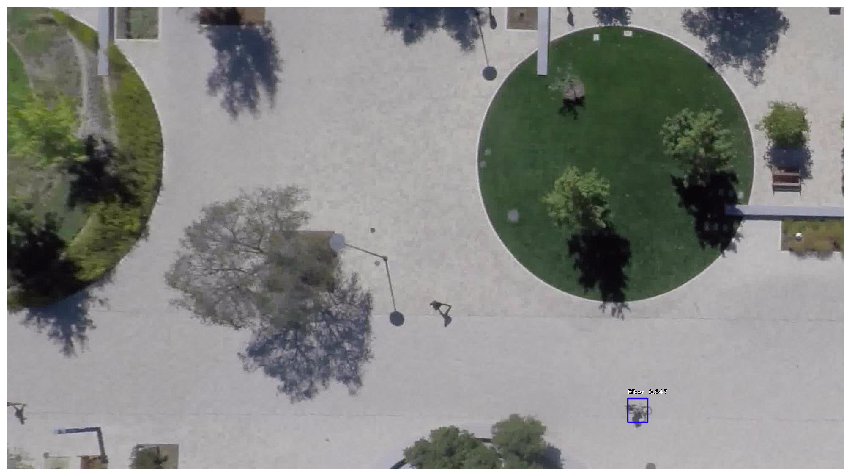

In [0]:
run_detection_image(f"{IMG_DIR}{input_jpg}")

In [0]:
dbutils.fs.cp(f"dbfs:/tmp/{input_jpg}", f"dbfs:/FileStore/scored_{output_jpg}")

Out[26]: True

In [0]:
displayHTML(f"<img src='/files/scored_{output_jpg}'>")

### Closing Question: Do we need to keep the binary content in Delta? 

A better idea might be to use Delta as a versioned metadata store. If we wanted to ensure the integrity of the underlying video files, we could also track a one-way hash of the binary content to ensure that it hasn't changed between updates...

Saves us the complexity of safely handling massive bytes arrays....?

In [0]:
from pyspark.sql.functions import pandas_udf, PandasUDFType
import base64

BLOCKSIZE = 65536

@pandas_udf("string", PandasUDFType.SCALAR)
def sha1_hash(x):
  
  import hashlib
  
  def hash_column(y):
    h = hashlib.sha1(y)
    return h.hexdigest()
    
  return x.apply(hash_column)

In [0]:
silver_df_sha = silver_df.withColumn("hash", sha1_hash(col("content")))
display(silver_df_sha)

path,modificationTime,length,content,start_timestamp,end_timestamp,hash
dbfs:/home/andrew.weaver@databricks.com/drone/bronze/out/start_2020-05-04T09:54:18_end_2020-05-04T09:54:48_bookstore_video6.mov,2020-12-11T13:30:37.000+0000,66908896,AAAAFGZ0eXBxdCAgAAACAHF0ICAAAAAId2lkZQP84LRtZGF0/9j//gAOTGF2YzU0LjM1LjAA/9sAQwAICgoLCgsNDQ0NDQ0QDxAQEBAQEBAQEBAQEhISFRUVEhISEBASEhQUFRUXFxcVFRUVFxcZGRkeHhwcIyMkKysz/8QBogA= (truncated),2020-05-04T09:54:18.000+0000,2020-05-04T09:54:48.000+0000,fc25fdb40201ee10352757956c876ba629b790f7
dbfs:/home/andrew.weaver@databricks.com/drone/bronze/out/start_2020-05-04T09:56:47_end_2020-05-04T09:57:17_bookstore_video1.mov,2020-12-11T13:29:53.000+0000,66589426,AAAAFGZ0eXBxdCAgAAACAHF0ICAAAAAId2lkZQP4AIJtZGF0/9j//gAOTGF2YzU0LjM1LjAA/9sAQwAICgoLCgsNDQ0NDQ0QDxAQEBAQEBAQEBAQEhISFRUVEhISEBASEhQUFRUXFxcVFRUVFxcZGRkeHhwcIyMkKysz/8QBogA= (truncated),2020-05-04T09:56:47.000+0000,2020-05-04T09:57:17.000+0000,7094bc95453a1a8df7494d703349d2dc725220ae
dbfs:/home/andrew.weaver@databricks.com/drone/bronze/out/start_2020-05-04T09:55:48_end_2020-05-04T09:56:18_bookstore_video6.mov,2020-12-11T13:30:48.000+0000,66500493,AAAAFGZ0eXBxdCAgAAACAHF0ICAAAAAId2lkZQP2pZFtZGF0/9j//gAOTGF2YzU0LjM1LjAA/9sAQwAICgoLCgsNDQ0NDQ0QDxAQEBAQEBAQEBAQEhISFRUVEhISEBASEhQUFRUXFxcVFRUVFxcZGRkeHhwcIyMkKysz/8QBogA= (truncated),2020-05-04T09:55:48.000+0000,2020-05-04T09:56:18.000+0000,aa7c1e5fdbc911333b71e440b80cf77ce39266c4
dbfs:/home/andrew.weaver@databricks.com/drone/bronze/out/start_2020-05-04T09:54:48_end_2020-05-04T09:55:18_bookstore_video6.mov,2020-12-11T13:30:40.000+0000,66446973,AAAAFGZ0eXBxdCAgAAACAHF0ICAAAAAId2lkZQP11DltZGF0/9j//gAOTGF2YzU0LjM1LjAA/9sAQwAICgoLCgsNDQ0NDQ0QDxAQEBAQEBAQEBAQEhISFRUVEhISEBASEhQUFRUXFxcVFRUVFxcZGRkeHhwcIyMkKysz/8QBogA= (truncated),2020-05-04T09:54:48.000+0000,2020-05-04T09:55:18.000+0000,e0c5aa2baa2cdfb84fd9b8bcdbdd4531ef9a2c34
dbfs:/home/andrew.weaver@databricks.com/drone/bronze/out/start_2020-05-04T09:59:17_end_2020-05-04T09:59:47_bookstore_video2.mov,2020-12-11T13:30:04.000+0000,66041027,AAAAFGZ0eXBxdCAgAAACAHF0ICAAAAAId2lkZQPvouNtZGF0/9j//gAOTGF2YzU0LjM1LjAA/9sAQwAICgoLCgsNDQ0NDQ0QDxAQEBAQEBAQEBAQEhISFRUVEhISEBASEhQUFRUXFxcVFRUVFxcZGRkeHhwcIyMkKysz/8QBogA= (truncated),2020-05-04T09:59:17.000+0000,2020-05-04T09:59:47.000+0000,e50b4a74c74d29ffa02cb759f4d94d16a741ccb4
dbfs:/home/andrew.weaver@databricks.com/drone/bronze/out/start_2020-05-04T09:59:47_end_2020-05-04T10:00:17_bookstore_video2.mov,2020-12-11T13:30:06.000+0000,65871785,AAAAFGZ0eXBxdCAgAAACAHF0ICAAAAAId2lkZQPtDbFtZGF0/9j//gAOTGF2YzU0LjM1LjAA/9sAQwAICgoLCgsNDQ0NDQ0QDxAQEBAQEBAQEBAQEhISFRUVEhISEBASEhQUFRUXFxcVFRUVFxcZGRkeHhwcIyMkKysz/8QBogA= (truncated),2020-05-04T09:59:47.000+0000,2020-05-04T10:00:17.000+0000,636827b817e730cf441d029126d82de0a53e7c91
dbfs:/home/andrew.weaver@databricks.com/drone/bronze/out/start_2020-05-04T09:59:19_end_2020-05-04T09:59:49_hyang_video13.mov,2020-12-11T13:30:57.000+0000,65691057,AAAAFGZ0eXBxdCAgAAACAHF0ICAAAAAId2lkZQPqS7ltZGF0/9j//gAOTGF2YzU0LjM1LjAA/9sAQwAICgoLCgsNDQ0NDQ0QDxAQEBAQEBAQEBAQEhISFRUVEhISEBASEhQUFRUXFxcVFRUVFxcZGRkeHhwcIyMkKysz/8QBogA= (truncated),2020-05-04T09:59:19.000+0000,2020-05-04T09:59:49.000+0000,d2169a5f29f5ba44f805db86fda2d9217d2c1de2
dbfs:/home/andrew.weaver@databricks.com/drone/bronze/out/start_2020-05-04T10:01:17_end_2020-05-04T10:01:47_bookstore_video2.mov,2020-12-11T13:30:11.000+0000,65494461,AAAAFGZ0eXBxdCAgAAACAHF0ICAAAAAId2lkZQPnS91tZGF0/9j//gAOTGF2YzU0LjM1LjAA/9sAQwAICgoLCgsNDQ0NDQ0QDxAQEBAQEBAQEBAQEhISFRUVEhISEBASEhQUFRUXFxcVFRUVFxcZGRkeHhwcIyMkKysz/8QBogA= (truncated),2020-05-04T10:01:17.000+0000,2020-05-04T10:01:47.000+0000,b620a24e129f881b04571f116326ff36649989d7
dbfs:/home/andrew.weaver@databricks.com/drone/bronze/out/start_2020-05-04T10:00:47_end_2020-05-04T10:01:17_bookstore_video2.mov,2020-12-11T13:30:10.000+0000,65475467,AAAAFGZ0eXBxdCAgAAACAHF0ICAAAAAId2lkZQPnAattZGF0/9j//gAOTGF2YzU0LjM1LjAA/9sAQwAICgoLCgsNDQ0NDQ0QDxAQEBAQEBAQEBAQEhISFRUVEhISEBASEhQUFRUXFxcVFRUVFxcZGRkeHhwcIyMkKysz/